In [1]:
!pip install split-folders
import os
import glob
import warnings
import pathlib
import splitfolders

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import itertools

import cv2
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models, layers
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Flatten, Dense, Dropout, Conv2D, MaxPooling2D
from keras.callbacks import ModelCheckpoint
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.image import ImageDataGenerator

warnings.filterwarnings('ignore')

In [2]:
!pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"sahrul59","key":"a2a0b57736f84e06bf56dc1d47197e48"}'}

In [3]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!ls ~/.kaggle

kaggle.json


In [5]:
!kaggle datasets download -d shiv28/animal-5-mammal

 99% 885M/892M [00:10<00:00, 137MB/s]
100% 892M/892M [00:10<00:00, 86.2MB/s]


In [6]:
!unzip animal-5-mammal.zip

Streaming output truncated to the last 5000 lines.
  inflating: Animal/train/cat/pixabay_cat_003879.jpg  
  inflating: Animal/train/cat/pixabay_cat_003880.jpg  
  inflating: Animal/train/cat/pixabay_cat_003881.jpg  
  inflating: Animal/train/cat/pixabay_cat_003882.jpg  
  inflating: Animal/train/cat/pixabay_cat_003883.jpg  
  inflating: Animal/train/cat/pixabay_cat_003884.jpg  
  inflating: Animal/train/cat/pixabay_cat_003885.jpg  
  inflating: Animal/train/cat/pixabay_cat_003886.jpg  
  inflating: Animal/train/cat/pixabay_cat_003887.jpg  
  inflating: Animal/train/cat/pixabay_cat_003888.jpg  
  inflating: Animal/train/cat/pixabay_cat_003889.jpg  
  inflating: Animal/train/cat/pixabay_cat_003891.jpg  
  inflating: Animal/train/cat/pixabay_cat_003892.jpg  
  inflating: Animal/train/cat/pixabay_cat_003893.jpg  
  inflating: Animal/train/cat/pixabay_cat_003894.jpg  
  inflating: Animal/train/cat/pixabay_cat_003895.jpg  
  inflating: Animal/train/cat/pixabay_cat_003897.jpg  
  inflating: A

In [7]:
splitfolders.ratio('/content/Animal/train', output="mammals-output", seed=42, ratio=(0.8,0.2), group_prefix=None)

Copying files: 13497 files [00:06, 2032.86 files/s]


In [8]:
train_path = '/content/mammals-output/train'
val_path = '/content/mammals-output/val'
pd.DataFrame(os.listdir(train_path),columns=['Files_Name'])

,Files_Name
0,LION
1,ELEPHANT
2,dog
3,cat
4,HORSE


In [9]:
files = [i for i in glob.glob(train_path + "//*//*")]
np.random.shuffle(files)
labels = [os.path.dirname(i).split("/")[-1] for i in files]
data = zip(files, labels)
dataframe = pd.DataFrame(data, columns = ["Image", "Label"])
dataframe

,Image,Label
0,/content/mammals-output/train/LION/images240.jpg,LION
1,/content/mammals-output/train/ELEPHANT/images3...,ELEPHANT
2,/content/mammals-output/train/HORSE/Img-9553.jpg,HORSE
3,/content/mammals-output/train/cat/pixabay_cat_...,cat
4,/content/mammals-output/train/cat/pixabay_cat_...,cat
...,...,...
10791,/content/mammals-output/train/cat/pixabay_cat_...,cat
10792,/content/mammals-output/train/ELEPHANT/IC8EO3R...,ELEPHANT
10793,/content/mammals-output/train/LION/OF6Q1IAT0OT...,LION
10794,/content/mammals-output/train/HORSE/images526.jpg,HORSE


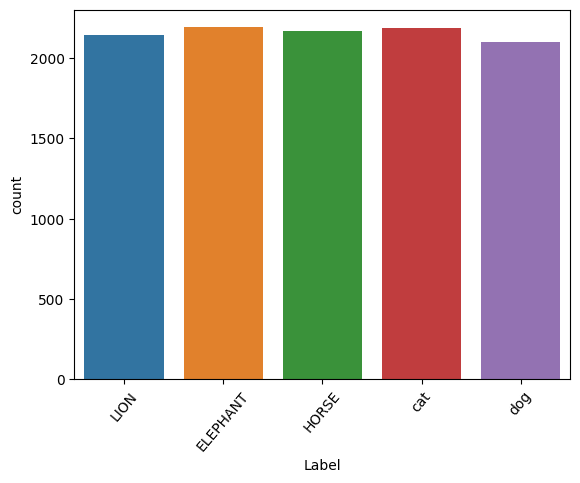

In [11]:
sns.countplot(x = dataframe["Label"])
plt.xticks(rotation = 50);

In [12]:
files = [i for i in glob.glob(val_path + "//*//*")]
np.random.shuffle(files)
labels = [os.path.dirname(i).split("/")[-1] for i in files]
data = zip(files, labels)
dataframe = pd.DataFrame(data, columns = ["Image", "Label"])
dataframe

,Image,Label
0,/content/mammals-output/val/LION/BZ039MHPVUH3.jpg,LION
1,/content/mammals-output/val/LION/CXPJBDV4W8HW.jpg,LION
2,/content/mammals-output/val/ELEPHANT/V4C2UJ483...,ELEPHANT
3,/content/mammals-output/val/HORSE/MME5T5XKFYK3...,HORSE
4,/content/mammals-output/val/dog/pixabay_dog_00...,dog
...,...,...
2696,/content/mammals-output/val/HORSE/Img-6292.jpg,HORSE
2697,/content/mammals-output/val/ELEPHANT/A1UIVW6PJ...,ELEPHANT
2698,/content/mammals-output/val/dog/pixabay_dog_00...,dog
2699,/content/mammals-output/val/dog/flickr_dog_001...,dog


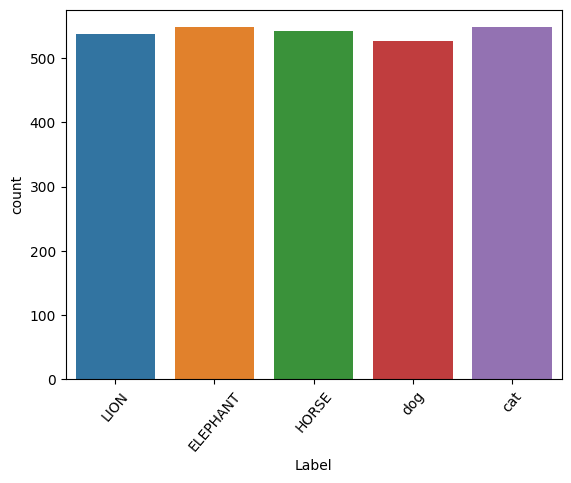

In [13]:
sns.countplot(x = dataframe["Label"])
plt.xticks(rotation = 50);

In [15]:
train_data_dir = train_path
val_data_dir =  val_path
batch_size = 32
target_size = (150, 150)

train_datagen = ImageDataGenerator(
    rescale = 1.0/255,
    rotation_range = 30,
    zoom_range=0.2,
    vertical_flip = True,
    shear_range = 0.2,
    fill_mode = 'nearest'
    )

val_datagen = ImageDataGenerator (
    rescale = 1.0/255
    )

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    batch_size = batch_size,
    class_mode = 'categorical',
    target_size = target_size
    )

val_generator = val_datagen.flow_from_directory(
    val_data_dir,
    batch_size = batch_size,
    class_mode = 'categorical',
    target_size = target_size
)

Found 10796 images belonging to 5 classes.
Found 2700 images belonging to 5 classes.


In [16]:
def get_class_names(generator):
    return list(generator.class_indices.keys())

class_names = get_class_names(train_generator)
print("Class names:", class_names)

Class names: ['ELEPHANT', 'HORSE', 'LION', 'cat', 'dog']


In [17]:
def Show_Images(target_gen):
    batch_images, batch_labels = next(target_gen)

    class_labels = list(target_gen.class_indices.keys())

    plt.figure(figsize=(20, 20))
    for n , i in enumerate(list(np.random.randint(0,len(batch_images),16))):
        plt.subplot(4, 4, n + 1)
        plt.imshow(batch_images[i])
        plt.title(class_labels[np.argmax(batch_labels[i])])
        plt.axis('off')
    plt.show()

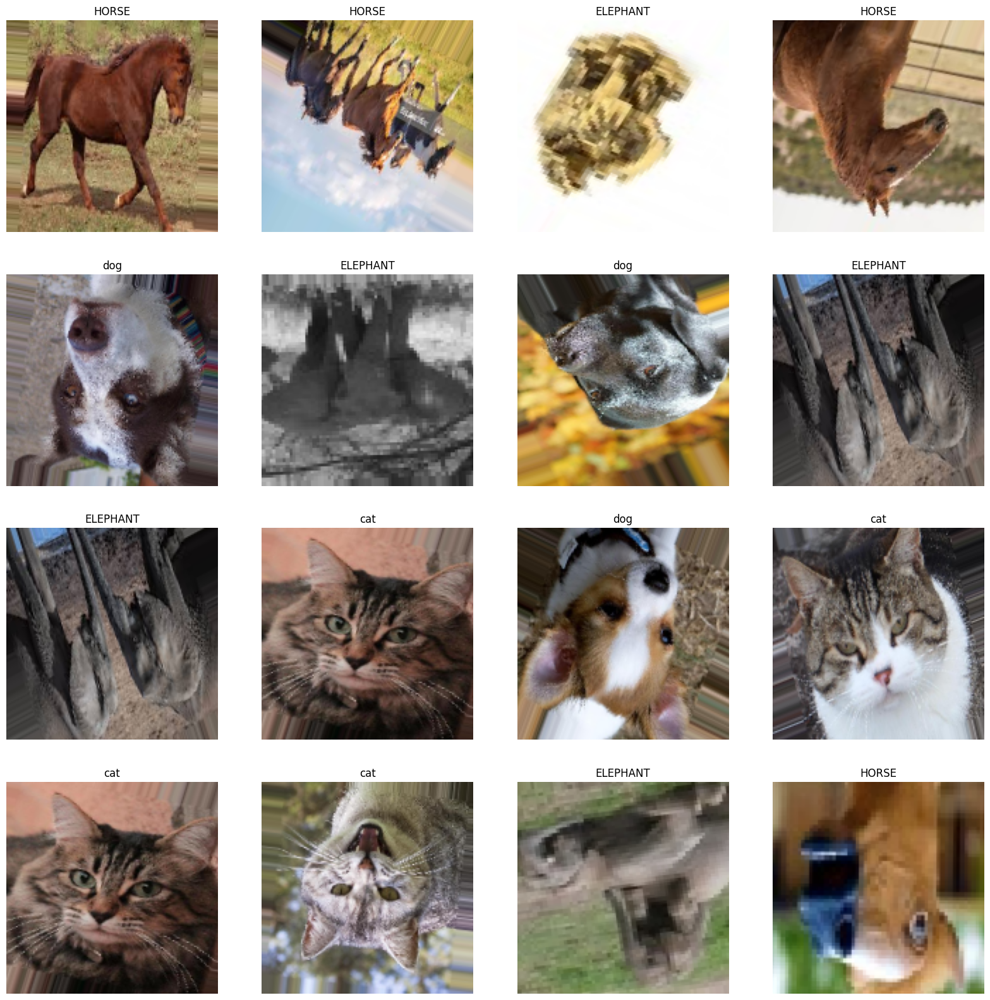

In [18]:
Show_Images(train_generator)

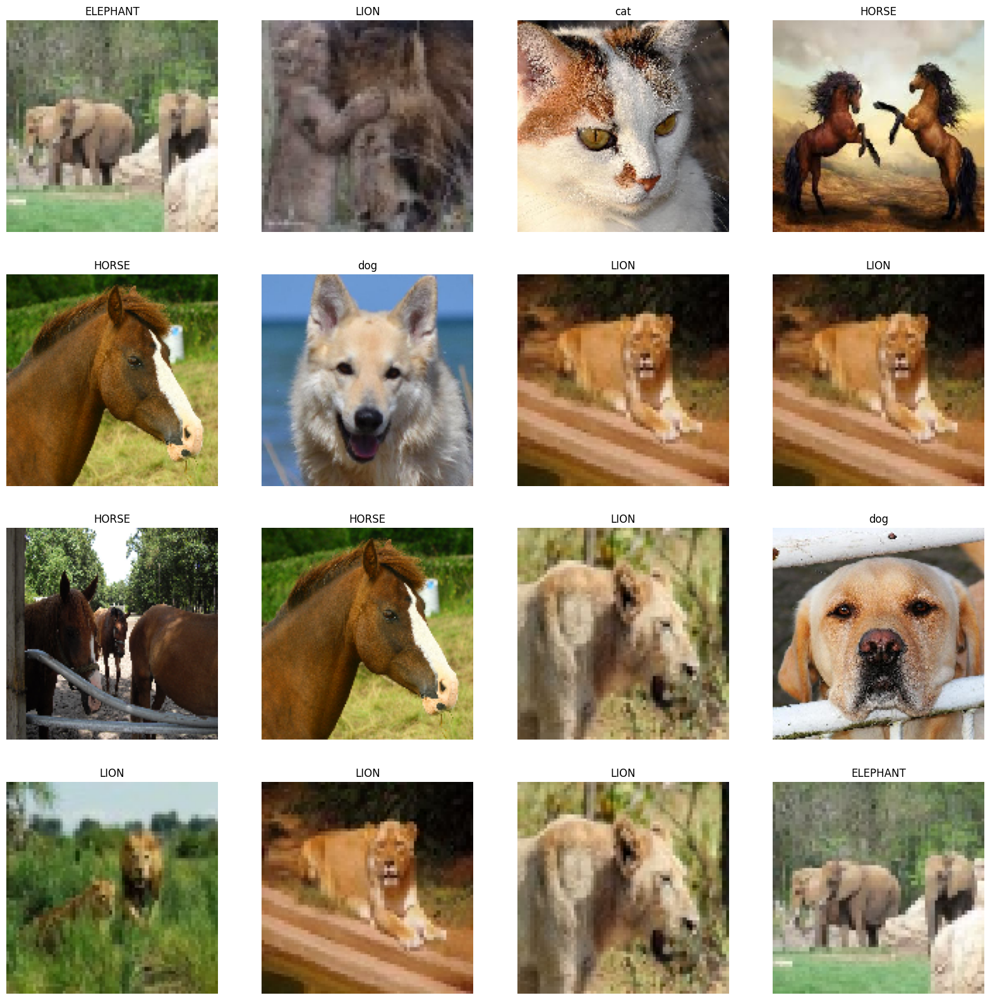

In [19]:
Show_Images(val_generator)

In [20]:
pre_trained_model = MobileNetV2(weights="imagenet", include_top=False,
                                input_tensor=Input(shape=(150, 150, 3))
                                )

for layer in pre_trained_model.layers:
    layer.trainable = False

model = Sequential()
model.add(pre_trained_model)
model.add(Conv2D(128, (3, 3), activation="relu"))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten(name="flatten"))
model.add(Dropout(0.5))
model.add(Dense(32, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dropout(0.5))
model.add(Dense(5, activation='softmax'))

model.summary()

9406464/9406464 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 5, 5, 1280)        2257984   
 tional)                                                         
                                                                 
 conv2d (Conv2D)             (None, 3, 3, 128)         1474688   
                                                                 
 max_pooling2d (MaxPooling2  (None, 1, 1, 128)         0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 128)               0         
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                           

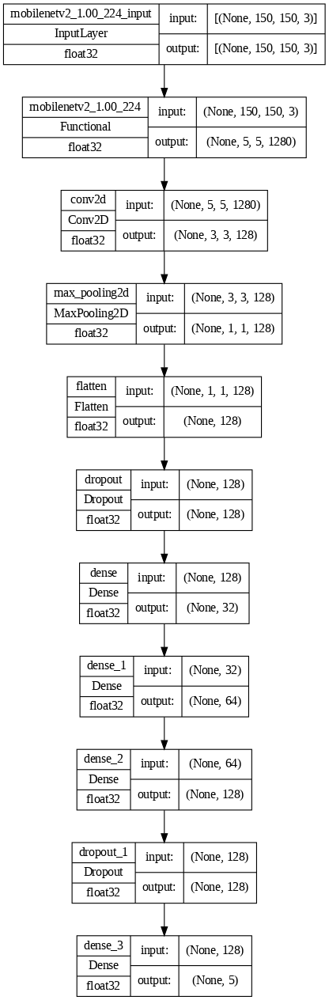

In [21]:
tf.keras.utils.plot_model(model,
                          to_file='model.png',
                          show_shapes=True,
                          show_layer_names=True,
                          show_dtype=True,dpi=80
                          )

In [25]:
accuracy_threshold = 92e-2
class stop(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if logs.get('accuracy') > accuracy_threshold and logs.get('val_accuracy') > accuracy_threshold:
      print('\nFor Epoch', epoch, '\nAccuracy has reach = %2.2f%%' %(logs['accuracy']*100), 'training has been stopped.')
      self.model.stop_training=True

callbacks=stop()

checkpoint = ModelCheckpoint("my_model.keras",
                            save_best_only=True
                             )

In [26]:
int_lr = 1e-4
num_epoch = 100

optimizer = tf.optimizers.Adam(learning_rate=int_lr)
model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy']
              )

In [27]:
history = model.fit(train_generator,
                    epochs = num_epoch,
                    validation_data = val_generator,
                    callbacks = [callbacks, checkpoint]
                    )

Epoch 1/100
338/338 [==============================] - 94s 266ms/step - loss: 0.2847 - accuracy: 0.8964 - val_loss: 0.2010 - val_accuracy: 0.9204
Epoch 2/100
338/338 [==============================] - 93s 274ms/step - loss: 0.2746 - accuracy: 0.9039 - val_loss: 0.1973 - val_accuracy: 0.9263
Epoch 3/100
338/338 [==============================] - 89s 264ms/step - loss: 0.2717 - accuracy: 0.9014 - val_loss: 0.1956 - val_accuracy: 0.9237
Epoch 4/100
338/338 [==============================] - 87s 259ms/step - loss: 0.2836 - accuracy: 0.8976 - val_loss: 0.2023 - val_accuracy: 0.9270
Epoch 5/100
338/338 [==============================] - 90s 263ms/step - loss: 0.2745 - accuracy: 0.9014 - val_loss: 0.1937 - val_accuracy: 0.9270
Epoch 6/100
338/338 [==============================] - 91s 270ms/step - loss: 0.2823 - accuracy: 0.9006 - val_loss: 0.1958 - val_accuracy: 0.9244
Epoch 7/100
338/338 [==============================] - 89s 262ms/step - loss: 0.2799 - accuracy: 0.9014 - val_loss: 0.1972 -

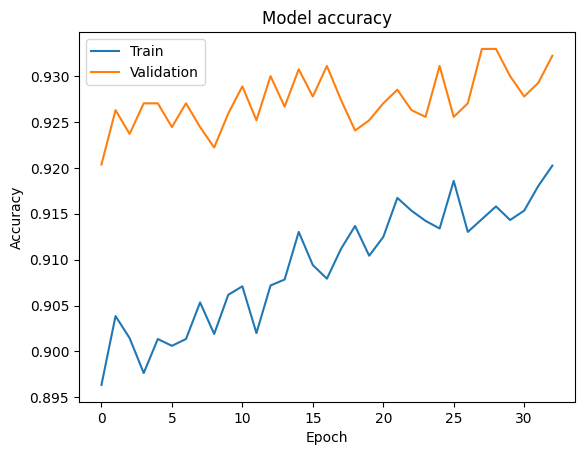

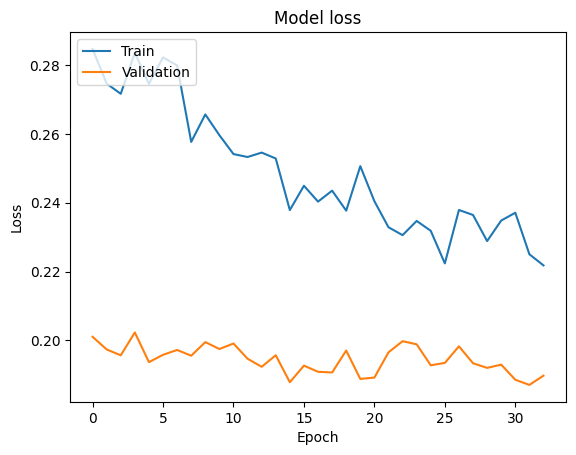

In [28]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [29]:
score, acc = model.evaluate(val_generator)
print('Test Loss =', score)
print('Test Accuracy =', acc)

85/85 [==============================] - 7s 87ms/step - loss: 0.1897 - accuracy: 0.9322
Test Loss = 0.1897221803665161
Test Accuracy = 0.9322222471237183


In [30]:
history_ = pd.DataFrame(history.history)
history_

,loss,accuracy,val_loss,val_accuracy
0,0.284717,0.896351,0.201022,0.920370
1,0.274632,0.903853,0.197342,0.926296
2,0.271667,0.901445,0.195635,0.923704
3,0.283605,0.897647,0.202284,0.927037
4,0.274547,0.901352,0.193651,0.927037
5,0.282254,0.900611,0.195789,0.924444
6,0.279922,0.901352,0.197189,0.927037
7,0.257686,0.905335,0.195525,0.924444
8,0.265669,0.901908,0.199475,0.922222
9,0.259633,0.906169,0.197475,0.925926


85/85 [==============================] - 8s 85ms/step


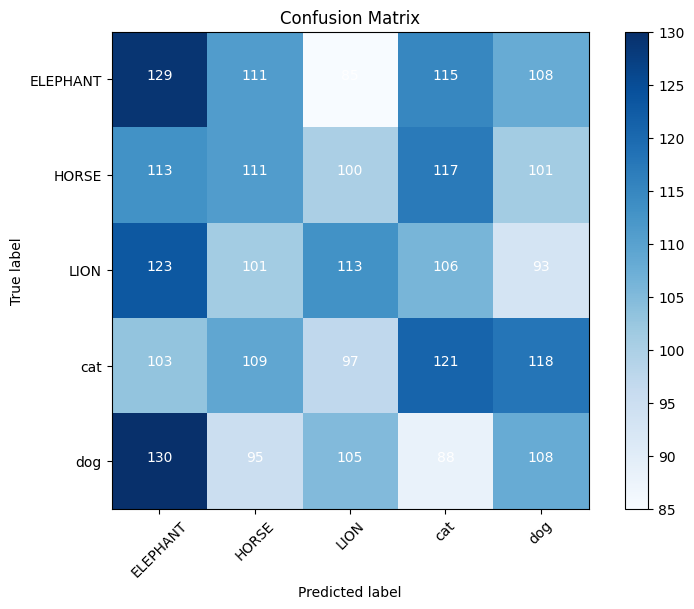

In [31]:
predictions = model.predict(val_generator)

predicted_labels = np.argmax(predictions, axis=1)

true_labels = val_generator.classes

cm = confusion_matrix(true_labels, predicted_labels)

class_names = val_generator.class_indices.keys()

def plot_confusion_matrix(cm, classes, normalize=False, title="Confusion Matrix", cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation="nearest", cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.0
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

plt.figure(figsize=(8, 6))
plot_confusion_matrix(cm, classes=class_names, title="Confusion Matrix")
plt.show()

1/1 [==============================] - 1s 831ms/step


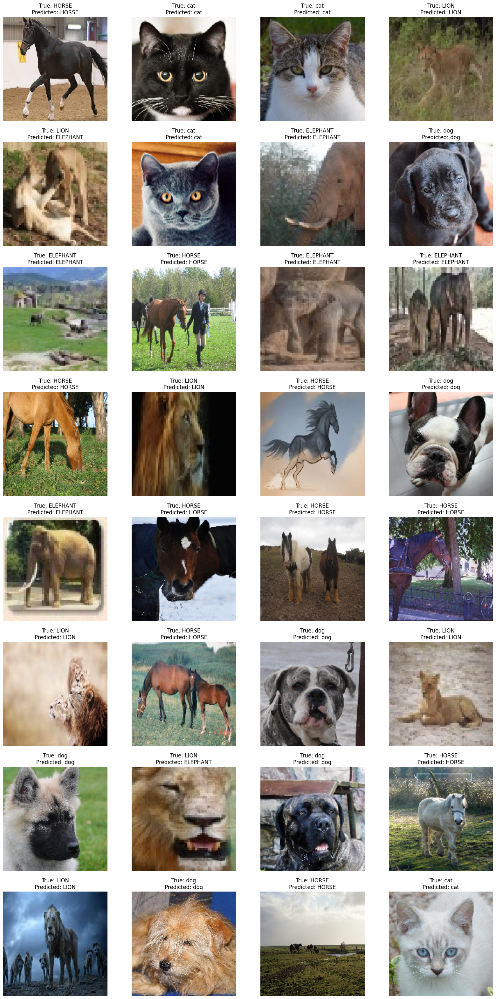

In [32]:
def Show_Images_with_Predictions(target_gen, model, class_names):
    batch_images, batch_labels = next(target_gen)

    class_labels = list(target_gen.class_indices.keys())
    class_names = list(class_names)  

    predictions = model.predict(batch_images)
    predicted_labels = np.argmax(predictions, axis=1)

    num_images = len(batch_images)
    num_rows = num_images // 4 + (num_images % 4 > 0)  
    plt.figure(figsize=(20, 5 * num_rows))

    for n, i in enumerate(range(num_images)):
        true_label = class_labels[np.argmax(batch_labels[i])]
        predicted_label = class_names[predicted_labels[i]]

        plt.subplot(num_rows, 4, n + 1)
        plt.imshow(batch_images[i])
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}')
        plt.axis('off')

    plt.show()

class_names = train_generator.class_indices.keys()

Show_Images_with_Predictions(val_generator, model, class_names)

In [33]:
export_dir = 'saved_model/'
tf.saved_model.save(model, export_dir)

In [34]:
converter = tf.lite.TFLiteConverter.from_saved_model(export_dir)
tflite_model = converter.convert()

In [35]:
tflite_model_file = pathlib.Path('mammals.tflite')
tflite_model_file.write_bytes(tflite_model)

14827844